In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import csv
import datetime
import json

In [2]:
# Clean rows from .csv file, that are not correct length (errors when oppening original csv file)

def clean_csv_data(file_name, min_cols=None):
    rows = []
    with open(file_name, "r") as f:
        for i, row in enumerate(f.readlines()):
            row = row.replace('\n', '')  # remove \n at the end
            if i == 0:
                rows.append(row.split(","))
                if min_cols is None:
                    min_cols = len(rows[0])
            else:
                cleaned_row = [str_value for str_value in row.split(",") if len(str_value) > 2]
                if min_cols <= len(cleaned_row) <= len(rows[0]):
                    rows.append(cleaned_row)
    
    new_file_name = file_name[:-4]+"_cleaned.csv"
    with open(new_file_name, 'w', newline='') as f:
        write = csv.writer(f)
        write.writerows(rows)
    return new_file_name

In [3]:
from pyproj import Transformer  # !pip install pyproj

transformer = Transformer.from_crs("EPSG:3794", "EPSG:4326", always_xy=True)

def convert_coordinates(x, y, reverse_coords=False):
    """
    Convert D96 coordinates to WGS84 (lon, lat).
    NOTE: x, y are coordinates of point on my plot that I use in analysis. 
          Real X and Y are switched. (use reverse_coords parameter).
    """
    if reverse_coords:
        x, y = y, x
    lon, lat = transformer.transform(x, y)
    return lon, lat

<h2>Lokacije čebelnjakov</h2>

In [4]:
file_name = "dataset-1/cebelnjaki-lokacija.csv"
cleaned_file_name = clean_csv_data(file_name)
df_lokacije = pd.read_csv(cleaned_file_name, index_col=None)
print(df_lokacije)

      CEBELNJAK_LOKACIJA       Y       X DAT_ZACETEK DAT_PRENEHANJE
0                  30946  611133  158612    04.02.05       17.05.10
1                  30950  558027  149356    04.02.05       15.09.16
2                  30955  615856  152326    04.02.05       05.07.13
3                  30969  546981  149503    04.02.05       22.12.15
4                  30970  543623  150656    04.02.05       22.12.15
...                  ...     ...     ...         ...            ...
6338               75895  590423  160963    20.08.19       04.12.20
6339               75928  487062  134339    23.08.19       14.03.21
6340               75986  439359  133263    28.08.19       06.01.21
6341               76126  534058   90486    20.09.19       21.07.21
6342               76308  612968  157415    08.11.19       07.05.21

[6343 rows x 5 columns]


In [5]:
# Zavrži podatke, katerih koordinate odstopajo
df_lokacije = df_lokacije.drop(df_lokacije[df_lokacije.X < 35000].index)
df_lokacije = df_lokacije.drop(df_lokacije[df_lokacije.X > 200000].index)

df_lokacije = df_lokacije.drop(df_lokacije[df_lokacije.Y < 35000].index)
df_lokacije = df_lokacije.drop(df_lokacije[df_lokacije.Y > 700000].index)

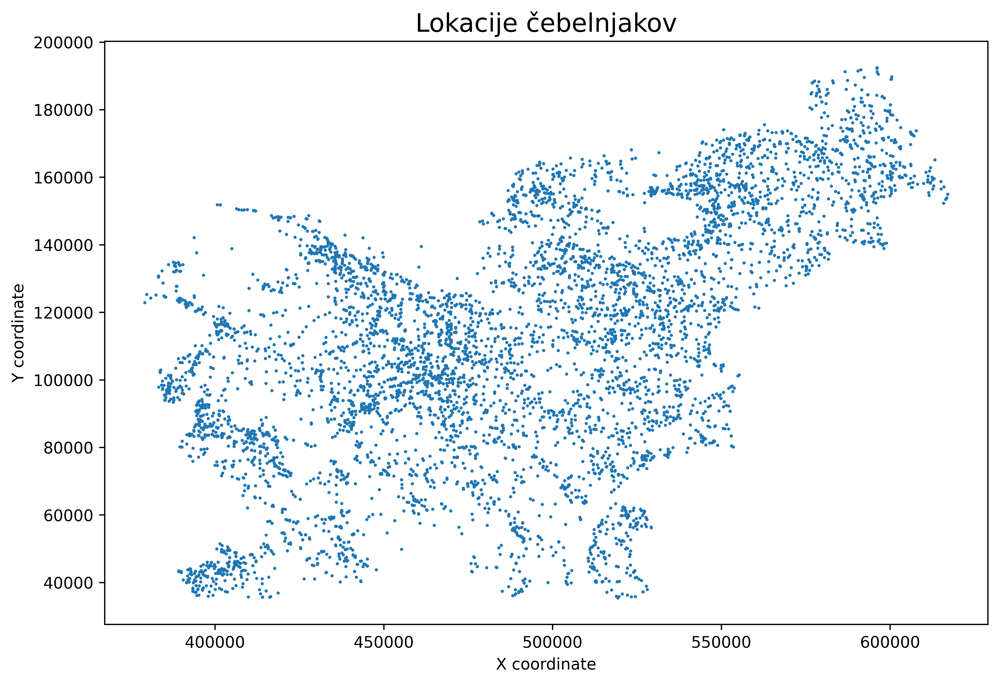

In [6]:
# Zamenjaj X in Y, drugače je slovenija zasukana na stran
Y_lokacije = [df_lokacije["X"][key] for key in df_lokacije["X"].keys()]
X_lokacije = [df_lokacije["Y"][key] for key in df_lokacije["Y"].keys()]

plt.figure(figsize=(10, 10), dpi=600)
plt.axes().set_aspect("equal")
plt.scatter(X_lokacije, Y_lokacije, s=1)
plt.title("Lokacije čebelnjakov", fontsize=16)
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.show()

<h2>Grupiranje čebelnjakov glede na razdaljo</h2>

In [15]:
import scipy.spatial as spatial  # https://stackoverflow.com/a/32424650

X_ = X_lokacije
Y_ = Y_lokacije

points = np.array([(X_[i], Y_[i]) for i in range(len(X_))])

max_distance = 1500  # meters

point_tree = spatial.cKDTree(points)

connected_points = []

for index, point in enumerate(points):
    indices_of_points_within_radius = point_tree.query_ball_point(point, max_distance)
    connected_points.append(indices_of_points_within_radius)
    # print(f"{index} -> {indices_of_points_within_radius}")

# Join clusters that have same indices in them but are not yet in the same cluster
# https://stackoverflow.com/a/4843408
import networkx as nx
from networkx.algorithms.components.connected import connected_components

def to_graph(clusters):
    G = nx.Graph()
    for cluster in clusters:
        G.add_nodes_from(cluster)
        G.add_edges_from(to_edges(cluster))
    return G

def to_edges(l):
    """ 
        treat `l` as a Graph and returns it's edges 
        to_edges(['a','b','c','d']) -> [(a,b), (b,c),(c,d)]
    """
    it = iter(l)
    last = next(it)
    for current in it:
        yield last, current
        last = current    

G = to_graph(connected_points)
clusters = list(connected_components(G))
# print(clusters)

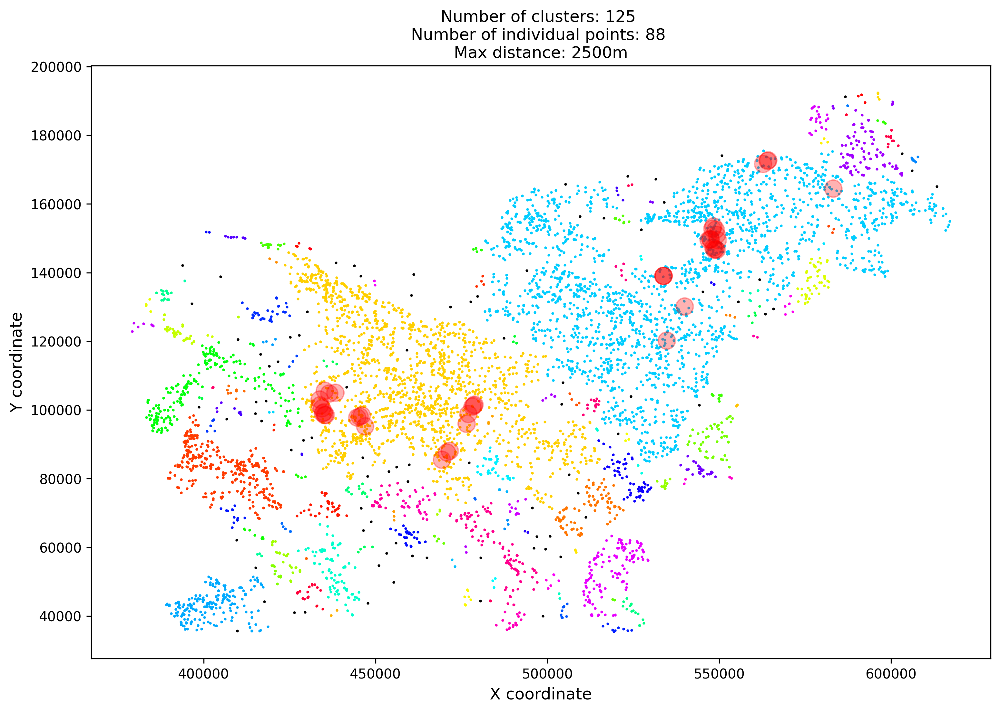

In [15]:
# Number of clusters in labels, ignoring noise if present.
n_clusters = len(clusters)
n_noise = [len(cluster) for cluster in clusters].count(1)
n_groups = n_clusters - n_noise  # število clusterjev, v katerih je več kot en element
labels = list(range(1, n_groups+1))
colors = [plt.cm.hsv(each) for each in np.linspace(0, 1, n_groups)]
np.random.shuffle(colors)

plt.figure(figsize=(12, 12), dpi=300)
ax = plt.axes()
ax.set_aspect("equal")

i = 0
for index, cluster in enumerate(clusters):
    if len(cluster) <= 1:
        # Black used for single element clusters.
        col = [0, 0, 0, 1]
        label = None
    else:
        col = colors[i]
        label = labels[i]
        i += 1
    xs = [X_[point_index] for point_index in cluster]
    ys = [Y_[point_index] for point_index in cluster]
#     plt.plot(xs, ys, color=tuple(col), linewidth=0.2)
    plt.scatter(xs, ys, color=tuple(col), s=1, label=[f"{label} ({len(cluster)})" if label is not None else None][0])
#     for ii, (x_, y_) in enumerate(zip(xs, ys)):
#         circle = plt.Circle((x_, y_), 0.1, color=col, linestyle="--", fill=None)
#         ax.add_patch(circle)
#         plt.text(x_, y_, f"{list(cluster)[ii]}")

# Nariši trenutne okužbe
for x_, y_ in zip(X_gniloba_active, Y_gniloba_active):
    circle = plt.Circle((x_, y_), max_distance, color="red", linestyle="-", alpha=0.3)
    ax.add_patch(circle)
        
plt.title(f'Number of clusters: {n_groups} \nNumber of individual points: {n_noise} \nMax distance: {max_distance}m')
plt.title(f'{lambda_}: {max_distance}m')
plt.xlabel("X coordinate", fontsize=12)
plt.ylabel("Y coordinate", fontsize=12)

# plt.legend(title="Group number:")
plt.show()

In [16]:
# transformiraj koordinate čebelnjakov in jih shrani
data = []
csv_data = ["id,lon,lat,cluster_id,owner_id"]
for index, (xs, ys) in enumerate(zip(X_lokacije, Y_lokacije)):
    lon, lat = convert_coordinates(xs, ys, reverse_coords=False)
    
    # Get id of cluster in which it is. If it's alone in cluster, set its id to 0
    cluster_indices = []
    i = 1
    for cluster in clusters:
        if len(cluster) > 1:
            cluster_indices.append(i)
            i += 1
        else:
            cluster_indices.append(0)
            
    cluster_id = cluster_indices[[list(cluster).count(index) for cluster in clusters].index(1)]
    
    subdata = {
        "lon": lon,
        "lat": lat,
        "id": index,
        "cluster_id": cluster_id,
        "owner_id": 0,
    }
    data.append(subdata)
    csv_data.append(','.join([str(item) for item in [index, lon, lat, cluster_id, 0]]))

with open('generated_data/beehive_location_data.json', 'w') as f:
    json.dump(data, f)
    
np.savetxt('generated_data/beehive_location_data.csv', 
           csv_data,
           delimiter =", ", 
           fmt ='% s')


<h3>Get nodes that are within given number of connections from specific node in networkX graph</h3>

In [17]:
from networkx.algorithms.shortest_paths.unweighted import single_source_shortest_path_length

In [18]:
selected_node_number = 100
max_number_of_connections = 10

lengths = single_source_shortest_path_length(G, selected_node_number)

valid_nodes = [node_nr for node_nr, length in lengths.items() if length <= max_number_of_connections]

print(lengths)
print(valid_nodes)

{100: 0, 2547: 1, 2291: 1, 5387: 2, 2707: 2, 133: 3, 2706: 3, 41: 4, 5034: 4, 97: 5, 134: 5, 4258: 6, 60: 7, 5033: 8, 2703: 9, 135: 9, 299: 10, 93: 10, 485: 11, 3890: 11, 92: 11, 5406: 11, 486: 12, 295: 12, 425: 12, 5352: 13, 1096: 13, 938: 13, 529: 13, 2708: 13, 3421: 13, 356: 14, 936: 14, 937: 14, 5195: 14, 426: 14, 2217: 14, 3023: 14, 3025: 14, 2200: 14, 4761: 14, 4092: 14, 3102: 14, 3039: 14, 4747: 15, 6285: 15, 530: 15, 2705: 15, 2967: 15, 935: 15, 3891: 15, 1871: 15, 3024: 15, 3029: 15, 3038: 15, 5600: 15, 3037: 15, 487: 15, 1145: 15, 5637: 16, 136: 16, 2704: 16, 531: 16, 2709: 16, 31: 16, 423: 16, 939: 16, 424: 16, 427: 16, 953: 16, 4288: 16, 4289: 16, 4290: 16, 3412: 16, 3414: 16, 3035: 16, 3420: 16, 357: 16, 362: 16, 138: 17, 650: 17, 1679: 17, 4632: 17, 2337: 17, 422: 17, 40: 17, 934: 17, 6189: 17, 4140: 17, 6331: 17, 3031: 17, 3033: 17, 360: 17, 6013: 17, 137: 18, 5512: 18, 1037: 18, 1681: 18, 6056: 18, 297: 18, 298: 18, 3889: 18, 6197: 18, 4287: 18, 5980: 18, 3043: 18, 3044

<h2>Premiki čebelnjakov</h2>

In [19]:
file_name = "dataset-1/premiki_cebeljih_druzin.csv"
cleaned_file_name = clean_csv_data(file_name)
df_premiki = pd.read_csv(cleaned_file_name, index_col=None)

df_premiki['DATE_MOVE'] = pd.to_datetime(df_premiki['DATE_MOVE'], format='%d.%m.%y')

# Filter by date
date_from = "2021-01-01"
date_to = "2022-01-01"
df_premiki_date_filtered = df_premiki.loc[(df_premiki['DATE_MOVE'] >= date_from) & (df_premiki['DATE_MOVE'] <= date_to)]

# Filter all that were in given month (example: 3 = march)
df_premiki_month_filtered = df_premiki.loc[(df_premiki['DATE_MOVE'].dt.month == 6)]

df_premiki = df_premiki_date_filtered
# df_premiki = df_premiki_month_filtered

print(df_premiki)

       LOKACIJA_IZH       Y       X  LOKACIJA_DEST  Y_DEST  X_DEST  DATE_MOVE
11            36413  544531  149310          30963  616960  155132 2021-07-16
16            70587  551972  151863          30978  554552  151297 2021-05-25
21            36415  545031  149845          30978  554552  151297 2021-07-19
34            78952  551498   94875          32216  478226  100980 2021-06-16
52            30907  504922  155354          31097  502276  161490 2021-04-26
...             ...     ...     ...            ...     ...     ...        ...
23791         53511  433377   50528          82016  447340   62398 2021-07-26
23792         79720  462489  121355          82019  486500  127754 2021-07-26
23793         57190  546076  124359          82022  447682   80916 2021-07-26
23794         81065  433237   57273          82040  446925   65734 2021-07-26
23795         81777  427840   53332          82042  446925   65734 2021-07-26

[2475 rows x 7 columns]


In [20]:
# Zavrži podatke, katerih koordinate odstopajo
df_premiki = df_premiki.drop(df_premiki[df_premiki.X < 35000].index)
df_premiki = df_premiki.drop(df_premiki[df_premiki.X > 200000].index)

df_premiki = df_premiki.drop(df_premiki[df_premiki.Y < 350000].index)
df_premiki = df_premiki.drop(df_premiki[df_premiki.Y > 700000].index)

df_premiki = df_premiki.drop(df_premiki[df_premiki.X_DEST < 35000].index)
df_premiki = df_premiki.drop(df_premiki[df_premiki.X_DEST > 200000].index)

df_premiki = df_premiki.drop(df_premiki[df_premiki.Y_DEST < 350000].index)
df_premiki = df_premiki.drop(df_premiki[df_premiki.Y_DEST > 700000].index)

In [21]:
# Zamenjaj X in Y, drugače je slovenija zasukana na stran
Y1 = [df_premiki["X"][key] for key in df_premiki["X"].keys()]
X1 = [df_premiki["Y"][key] for key in df_premiki["Y"].keys()]

Y2 = [df_premiki["X_DEST"][key] for key in df_premiki["X_DEST"].keys()]
X2 = [df_premiki["Y_DEST"][key] for key in df_premiki["Y_DEST"].keys()]

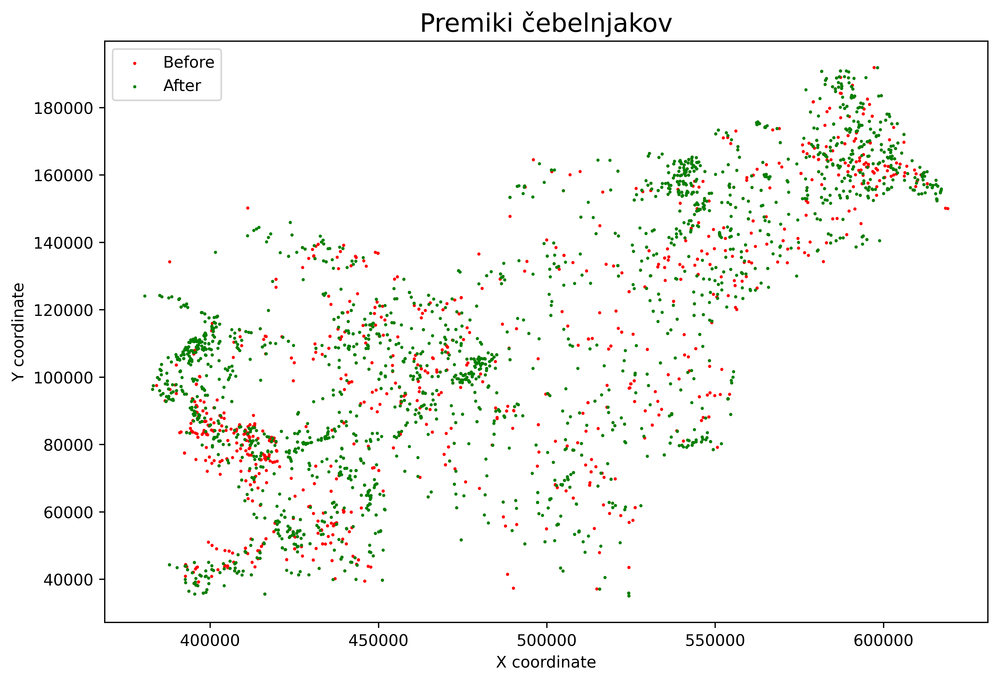

In [22]:
plt.figure(figsize=(10, 10), dpi=600)
plt.axes().set_aspect("equal")

plt.scatter(X1, Y1, s=1, c="red", label="Before")
plt.scatter(X2, Y2, s=1, c="green", label="After")

plt.title("Premiki čebelnjakov", fontsize=16)
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.legend()
plt.show()

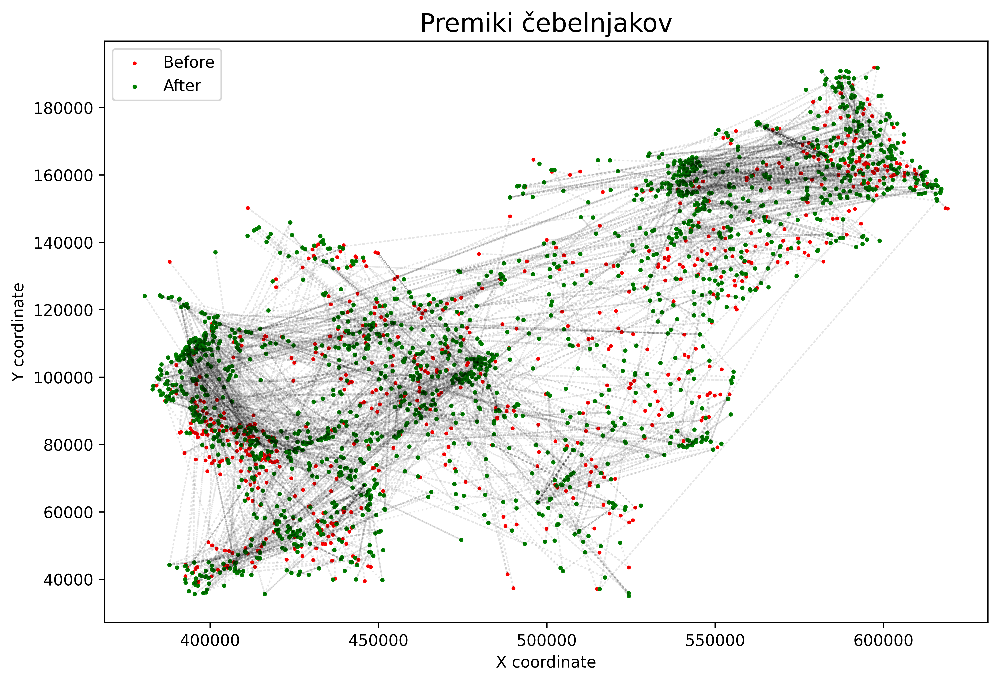

In [23]:
def drawArrow(A, B):
    plt.arrow(
        A[0], A[1], B[0] - A[0], B[1] - A[1], 
        length_includes_head=True, 
        width=0.01, 
        linestyle=":",
        alpha=0.1
    )

plt.figure(figsize=(10, 10), dpi=600)
plt.axes().set_aspect("equal")

for i in range(len(X1)):
    drawArrow([X1[i], Y1[i]], [X2[i], Y2[i]])

plt.scatter(X1, Y1, s=2, c="red", label="Before")
plt.scatter(X2, Y2, s=3, c="green", label="After")
    
plt.title("Premiki čebelnjakov", fontsize=16)
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.legend(loc="upper left")
plt.show()

<h2>Gniloba</h2>

In [9]:
file_name = "dataset-1/hgczi-lokacija.csv"
cleaned_file_name = file_name
cleaned_file_name = clean_csv_data(file_name, min_cols=4)
df_gniloba = pd.read_csv(cleaned_file_name, index_col=None)

# Filter by date
df_gniloba['DAT_ZACETEK'] = pd.to_datetime(df_gniloba['DAT_ZACETEK'], format='%d.%m.%y')
df_gniloba['DAT_PRENEHANJE'] = pd.to_datetime(df_gniloba['DAT_PRENEHANJE'], format='%d.%m.%y')

# Filtriraj po obdobju, ko je bila gniloba aktivna
date_from = "2020-01-01"  # Od kdaj naprej je bil začetek izbruha gnilobe
date_to = "2020-12-31"  # Do kdaj je bil konec izbruha gnilobe (None, da je še aktivno)

if date_to is None:
    df_gniloba_date_filtered = df_gniloba.loc[(df_gniloba['DAT_ZACETEK'] >= date_from) & pd.isnull(df_gniloba['DAT_PRENEHANJE'])]
else:
    df_gniloba_date_filtered = df_gniloba.loc[(df_gniloba['DAT_ZACETEK'] >= date_from) & (df_gniloba['DAT_PRENEHANJE'] <= date_to)]

# Filtriraj in prikaži samo čebelnjake z aktivno gnilobo
df_gniloba_active = df_gniloba.loc[pd.isnull(df_gniloba['DAT_PRENEHANJE'])]

# print(df_gniloba)
# print(df_gniloba_date_filtered)
# print(df_gniloba_active)

In [11]:
# Zamenjaj X in Y, drugače je slovenija zasukana na stran
Y_gniloba_date_filtered = [df_gniloba_date_filtered["X"][key] for key in df_gniloba_date_filtered["X"].keys()]
X_gniloba_date_filtered = [df_gniloba_date_filtered["Y"][key] for key in df_gniloba_date_filtered["Y"].keys()]

Y_gniloba_active = [df_gniloba_active["X"][key] for key in df_gniloba_active["X"].keys()]
X_gniloba_active = [df_gniloba_active["Y"][key] for key in df_gniloba_active["Y"].keys()]

In [12]:
def format_date(date):
    """
    From yyyy-mm-dd to dd.mm.yyyy
    """
    d = datetime.datetime.strptime(date, '%Y-%m-%d')
    return d.strftime('%d.%m.%Y')

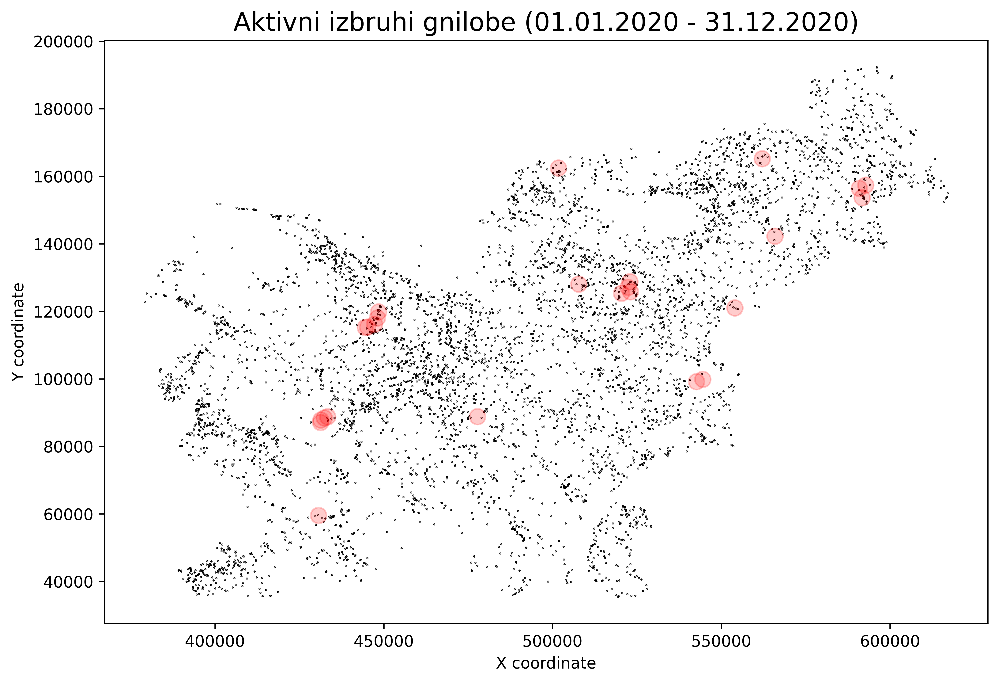

In [13]:
plt.figure(figsize=(10, 10), dpi=600)
plt.axes().set_aspect("equal")

plt.scatter(X_lokacije, Y_lokacije, s=0.1, c="black")

plt.scatter(X_gniloba_date_filtered, Y_gniloba_date_filtered, s=100, c="red", alpha=0.2)

plt.title(f"Aktivni izbruhi gnilobe ({format_date(date_from)} - {format_date(date_to)})", fontsize=16)
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.show()

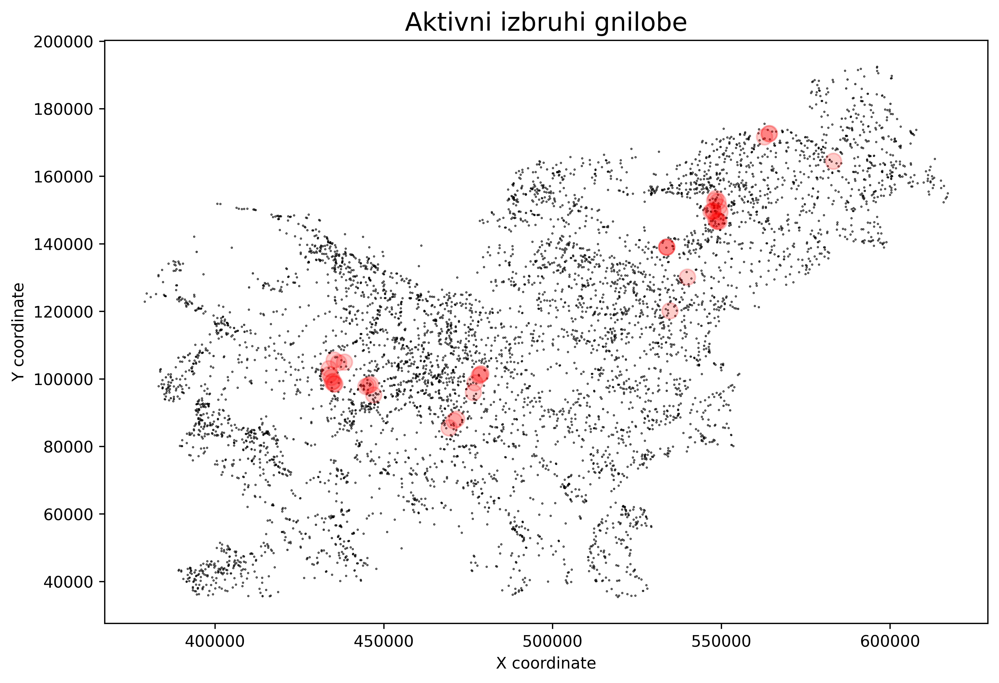

In [14]:
plt.figure(figsize=(10, 10), dpi=600)
plt.axes().set_aspect("equal")

plt.scatter(X_lokacije, Y_lokacije, s=0.1, c="black")

plt.scatter(X_gniloba_active, Y_gniloba_active, s=100, c="red", alpha=0.2)

plt.title("Aktivni izbruhi gnilobe", fontsize=16)
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.show()

<h2>Lokacije stojišč</h2>

In [24]:
file_name = "dataset-1/stojisca-lokacija.csv"
cleaned_file_name = clean_csv_data(file_name, min_cols=4)
df_stojisca = pd.read_csv(cleaned_file_name, index_col=None)

# Convert to date
df_stojisca['DAT_ZACETEK'] = pd.to_datetime(df_stojisca['DAT_ZACETEK'], format='%y.%m.%d')
df_stojisca['DAT_PRENEHANJE'] = pd.to_datetime(df_stojisca['DAT_PRENEHANJE'], format='%y.%m.%d')

# Filter by date
date_from = "2000-01-01"
date_to = None  # None for currenty active
if date_to is None:
    df_stojisca_date_filtered = df_stojisca.loc[(df_stojisca['DAT_ZACETEK'] >= date_from) & pd.isnull(df_stojisca['DAT_PRENEHANJE'])]
else:
    df_stojisca_date_filtered = df_stojisca.loc[(df_stojisca['DAT_ZACETEK'] >= date_from) & (df_stojisca['DAT_PRENEHANJE'] <= date_to)]

df_stojisca = df_stojisca_date_filtered

In [25]:
# Zavrži podatke, katerih koordinate odstopajo
df_stojisca = df_stojisca.drop(df_stojisca[df_stojisca.X < 35000].index)
df_stojisca = df_stojisca.drop(df_stojisca[df_stojisca.X > 200000].index)

df_stojisca = df_stojisca.drop(df_stojisca[df_stojisca.Y < 350000].index)
df_stojisca = df_stojisca.drop(df_stojisca[df_stojisca.Y > 700000].index)

In [26]:
# Zamenjaj X in Y, drugače je slovenija zasukana na stran
Y_stojisca = [df_stojisca["X"][key] for key in df_stojisca["X"].keys()]
X_stojisca = [df_stojisca["Y"][key] for key in df_stojisca["Y"].keys()]

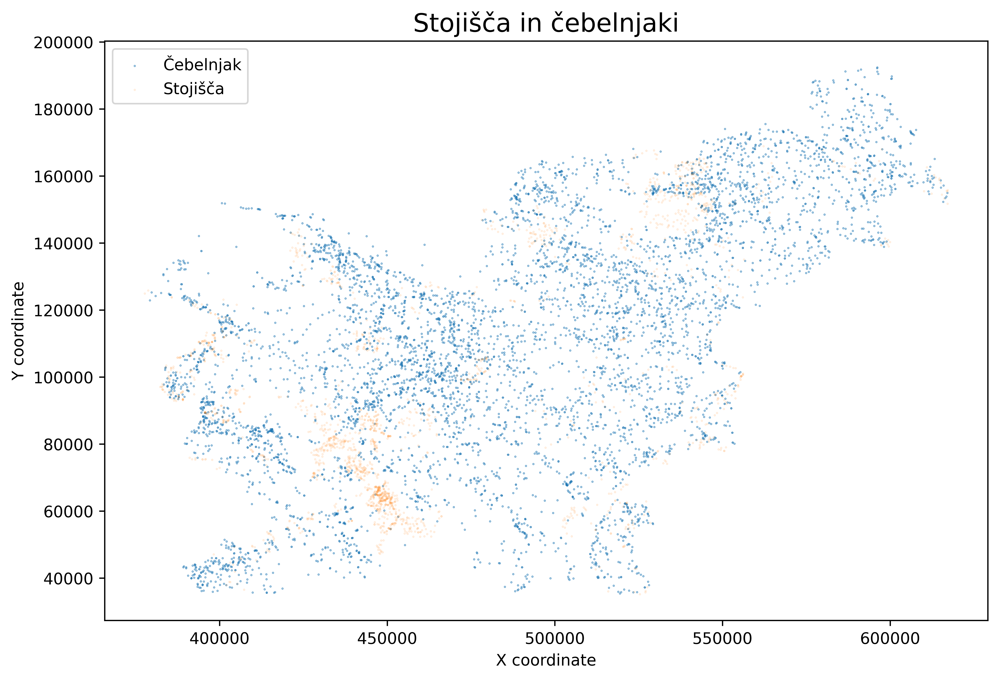

In [30]:
plt.figure(figsize=(10, 10), dpi=600)
plt.axes().set_aspect("equal")

plt.scatter(X_lokacije, Y_lokacije, s=0.1, alpha=0.75, label="Čebelnjak")
plt.scatter(X_stojisca, Y_stojisca, s=0.1, alpha=0.2, label="Stojišča")


plt.title("Stojišča in čebelnjaki", fontsize=16)
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.legend()
plt.show()

### Ideje
- Pretvorba koordinat v zemljepisno dolžino in širino
- Računanje razdalj med točkami (v km)
- Animacija premikov čebelnjakov po mesecih skozi leto (poletna, zimska paša)
- Na grafu lokacij čebelnjakov pogrupiraj med seboj vse, ki so povezani s 3km ali manj razdalje (nekaj v smislu networkX) (Kateri vse se okužijo, če se en okuži)
- Časovni prikaz izbruhov gnilobe
- Iskanje kam postavit panj da je čimbolj oddaljen od vseh okoliških panjev?